# loan_data

In [1]:
# Importing the libraries 

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

# Ignore harmless warnings

import warnings 
warnings.filterwarnings("ignore")

In [2]:
# load the loan data

loans = pd.read_csv(r"D:\iiit notes\Internship\19 season 7th jun-2021\loan_data.csv",header = 0)
loans.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [3]:
loans.shape

(9578, 14)

In [4]:
# Display the dataset information

loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


In [5]:
# Change the name of the variable to NFpaid

loans = loans.rename(columns = { 'not.fully.paid' : 'NFpaid' }, inplace = False)
loans.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,NFpaid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [6]:
# Count the target or dependent variable by '0' & '1' and 
# their proportion (> 10 :1, then the dataset is imbalance dataset)

Target_count = loans.NFpaid.value_counts()
print('Class 0', Target_count[0])
print('Class 1', Target_count[1])
print('proportion', round(Target_count[0] / Target_count[1], 2), ':1')
print('Total loans trans', len(loans))

Class 0 8045
Class 1 1533
proportion 5.25 :1
Total loans trans 9578


In [7]:
# Displaying Duplicate values with in dataset

loans_dup = loans[loans.duplicated(keep='last')]
loans_dup

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,NFpaid


In [8]:
cat_feats = ['purpose']
loans = pd.get_dummies(loans,columns = cat_feats,drop_first=True)
loans = pd.DataFrame(loans)
loans.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,NFpaid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,0,1,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0,1,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,0,1,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,0,1,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0,1,0,0,0,0,0


In [9]:
# Display the no of unique values in each variable

for i in loans.columns:
    print(loans[i].value_counts())

1    7710
0    1868
Name: credit.policy, dtype: int64
0.1253    354
0.0894    299
0.1183    243
0.1218    215
0.0963    210
         ... 
0.1756      1
0.1741      1
0.1772      1
0.1746      1
0.1941      1
Name: int.rate, Length: 249, dtype: int64
317.72    41
316.11    34
319.47    29
381.26    27
662.68    27
          ..
107.23     1
232.60     1
211.65     1
261.89     1
62.45      1
Name: installment, Length: 4788, dtype: int64
11.002100    308
10.819778    248
10.308953    224
10.596635    224
10.714418    221
            ... 
11.170717      1
11.956328      1
11.203679      1
10.292823      1
11.000499      1
Name: log.annual.inc, Length: 1987, dtype: int64
0.00     89
10.00    19
0.60     16
6.00     13
19.20    13
         ..
15.23     1
1.32      1
22.14     1
29.21     1
27.47     1
Name: dti, Length: 2529, dtype: int64
687    548
682    536
692    498
697    476
702    472
707    444
667    438
677    427
717    424
662    414
672    395
712    395
722    388
727    361
7

In [10]:
# Identify the independent and Target (dependent) variable

IndepVar = []
for col in loans.columns:
    if col != 'NFpaid':
        IndepVar.append(col)
        
TargetVar = 'NFpaid'

x = loans[IndepVar]
y = loans[TargetVar]

In [11]:
# Merge two Dataframes on index of both the dataframes

loans = x.merge(y, left_index=True, right_index=True)
loans.head()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business,NFpaid
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,1,0,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,1,0,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,1,0,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,1,0,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,1,0,0,0,0,0,0


In [12]:
loans.shape

(9578, 19)

In [13]:
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   credit.policy               9578 non-null   int64  
 1   int.rate                    9578 non-null   float64
 2   installment                 9578 non-null   float64
 3   log.annual.inc              9578 non-null   float64
 4   dti                         9578 non-null   float64
 5   fico                        9578 non-null   int64  
 6   days.with.cr.line           9578 non-null   float64
 7   revol.bal                   9578 non-null   int64  
 8   revol.util                  9578 non-null   float64
 9   inq.last.6mths              9578 non-null   int64  
 10  delinq.2yrs                 9578 non-null   int64  
 11  pub.rec                     9578 non-null   int64  
 12  purpose_credit_card         9578 non-null   uint8  
 13  purpose_debt_consolidation  9578 

In [14]:
# splitting the dataset into train and test

from sklearn.model_selection import train_test_split

x_train, x_test, y_train,y_test = train_test_split(x,y, test_size = 0.3, random_state=42)

# Random Forest Algorithm

In [15]:
#  Build Random forest classification model and train the model using the training sets 

from sklearn.ensemble import RandomForestClassifier

loansRF = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None, criterion='gini', 
                                                        max_depth=None, max_features='auto', max_leaf_nodes=None, 
                                                        max_samples=None, min_impurity_decrease=0.0, min_impurity_split=None, 
                                                        min_samples_leaf=1, min_samples_split=2, min_weight_fraction_leaf=0.0, 
                                                        n_estimators=500, n_jobs=None, oob_score=False, random_state=0, 
                                                        verbose=0, warm_start=False)
loansRF = loansRF.fit(x_train,y_train)

In [16]:
# To display the algorithm parameters

params1 = loansRF.get_params()
print(params1)

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 500, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}


In [17]:
# Predict the model with test dataset

y_pred = loansRF.predict(x_test)

In [18]:
# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)

# Area under ROC curve

from sklearn.metrics import roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y_pred), 3))

Confusion matrix: 
 [[  10  456]
 [  11 2397]]
Outcome Values : 
 10 456 11 2397
Classification report : 
               precision    recall  f1-score   support

           1       0.48      0.02      0.04       466
           0       0.84      1.00      0.91      2408

    accuracy                           0.84      2874
   macro avg       0.66      0.51      0.48      2874
weighted avg       0.78      0.84      0.77      2874

Accuracy : 83.8 %
Precision : 47.6 %
Recall : 2.1 %
F1 Score : 0.041
Balanced Accuracy : 50.8 %
MCC 0.073
roc_auc_score: 0.508


# Decision Tree

In [19]:
# To build the decision tree model with random sampling
from sklearn.tree import DecisionTreeClassifier
loansDT = DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                                   max_depth=None, max_features=None, max_leaf_nodes=None,
                                   min_impurity_decrease=0.0, min_impurity_split=None,
                                   min_samples_leaf=1, min_samples_split=2,min_weight_fraction_leaf =0.0,
                                   random_state=None, splitter='best')
loansDT = loansDT.fit(x_train,y_train)

In [20]:
# Predict the model with test dataset

y1_pred = loansDT.predict(x_test)

In [21]:
# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y1_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)

# Area under ROC curve

from sklearn.metrics import roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y1_pred), 3))

Confusion matrix: 
 [[  98  368]
 [ 414 1994]]
Outcome Values : 
 98 368 414 1994
Classification report : 
               precision    recall  f1-score   support

           1       0.19      0.21      0.20       466
           0       0.84      0.83      0.84      2408

    accuracy                           0.73      2874
   macro avg       0.52      0.52      0.52      2874
weighted avg       0.74      0.73      0.73      2874

Accuracy : 72.8 %
Precision : 19.1 %
Recall : 21.0 %
F1 Score : 0.2
Balanced Accuracy : 51.9 %
MCC 0.037
roc_auc_score: 0.519


# Logistic Regression

In [22]:
# To build the 'logistic regression' model with random sampling

from sklearn.linear_model import LogisticRegression

loansLR = LogisticRegression() 
loansLR = loansLR.fit(x_train,y_train)

# predicting the model 

y2_pred = loansLR.predict(x_test)

# Confusion matrix

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# actual values

actual = y_test

# predicted values

predicted = y2_pred

# confusion matrix

matrix = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None)
print('Confusion matrix: \n', matrix)

# outcome values order in sklearn

tp, fn, fp, tn = confusion_matrix(actual, predicted, labels=[1, 0], sample_weight=None, normalize=None).reshape(-1)

print('Outcome Values : \n', tp, fn, fp, tn)

# Classification report for precision, rrecall f1-Score and accuracy

matrix = classification_report(actual, predicted, labels=[1,0])
print('Classification report : \n', matrix)

# Calculating the metrics

sensitivity = round(tp/(tp+fn), 3)

specificity = round(tn/(tn+fp), 3)

accuracy = round((tp+tn)/(tp+fp+fn+tn), 3)
balanced_accuracy = round((sensitivity+specificity)/2, 3)
precision = round(tp/(tp+fp), 3)
f1Score = round((2*tp/(2*tp+fp+fn)), 3)

# Mathews Correlation coefficient (MCC). Range of values of MCC lie between -1 to +1
# A Model with a score of +1 is perfect model and -1 is a poor model

from math import sqrt

m = (tp+fp)*(tp+fn)*(tn+fp)*(tn+fn)

MCC = round(((tp* tn) - (fp * fn)) / sqrt(m), 3)

print('Accuracy :', round(accuracy*100, 2), '%')
print('Precision :', round(precision*100, 2), '%')
print('Recall :', round(sensitivity*100, 2), '%')
print('F1 Score :', f1Score)
print('Balanced Accuracy :', round(balanced_accuracy*100, 2), '%')
print('MCC', MCC)

# Area under ROC curve

from sklearn.metrics import roc_auc_score

print('roc_auc_score:', round(roc_auc_score(y_test, y2_pred), 3))

Confusion matrix: 
 [[   2  464]
 [   1 2407]]
Outcome Values : 
 2 464 1 2407
Classification report : 
               precision    recall  f1-score   support

           1       0.67      0.00      0.01       466
           0       0.84      1.00      0.91      2408

    accuracy                           0.84      2874
   macro avg       0.75      0.50      0.46      2874
weighted avg       0.81      0.84      0.77      2874

Accuracy : 83.8 %
Precision : 66.7 %
Recall : 0.4 %
F1 Score : 0.009
Balanced Accuracy : 50.2 %
MCC 0.044
roc_auc_score: 0.502


# random forest

Feature: 0, Score: 0.01578
Feature: 1, Score: 0.10420
Feature: 2, Score: 0.11398
Feature: 3, Score: 0.10962
Feature: 4, Score: 0.11179
Feature: 5, Score: 0.07917
Feature: 6, Score: 0.11295
Feature: 7, Score: 0.11247
Feature: 8, Score: 0.10989
Feature: 9, Score: 0.05485
Feature: 10, Score: 0.01356
Feature: 11, Score: 0.01001
Feature: 12, Score: 0.00818
Feature: 13, Score: 0.01482
Feature: 14, Score: 0.00696
Feature: 15, Score: 0.00782
Feature: 16, Score: 0.00477
Feature: 17, Score: 0.00920


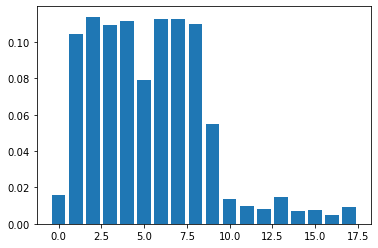

In [23]:
# Get feature (independent variables) importance

from matplotlib import pyplot

importance = loansRF.feature_importances_

# summarize feature importance

for i,j in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,j))
    
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

# The positive scores indicate a feature that predicts class 1,
# whereas the negative scores indicate a feature that predicts class 0

In [24]:
loans.columns

Index(['credit.policy', 'int.rate', 'installment', 'log.annual.inc', 'dti',
       'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'purpose_credit_card',
       'purpose_debt_consolidation', 'purpose_educational',
       'purpose_home_improvement', 'purpose_major_purchase',
       'purpose_small_business', 'NFpaid'],
      dtype='object')

In [25]:
cols = ['credit.policy', 'int.rate', 'installment', 'log.annual.inc', 'dti',
       'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths', 'delinq.2yrs', 'pub.rec', 'purpose_credit_card',
       'purpose_debt_consolidation', 'purpose_educational',
       'purpose_home_improvement', 'purpose_major_purchase',
       'purpose_small_business']

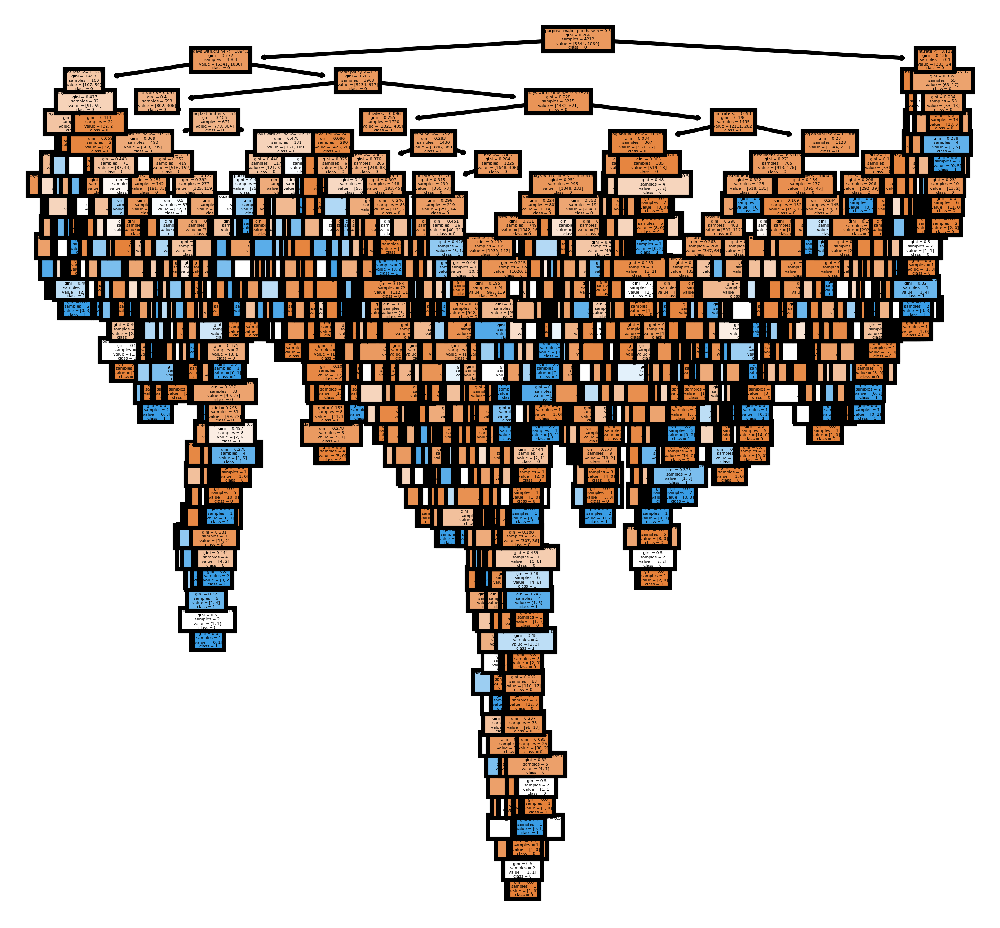

In [26]:
# Visualize individual trees and code below visualizes the first decision tree of Random Forest
from sklearn import tree
fn1 = cols                  # All independent features
cn1 =['0','1']

fig, axes = plt.subplots(nrows = 1, ncols=1, figsize=(4,4), dpi=800) # dpi means depth
tree.plot_tree(loansRF.estimators_[0], feature_names=fn1, class_names=cn1, filled = True);
fig.savefig('loansRF1.png')

In [27]:
# Visualize individual trees and code below visualizes the first 5 decision trees of Random Forest 
from sklearn import tree 
fn2=cols 
cn2=['0', '1']
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (10,2), dpi=3000) 
for index in range(0, 5): 
    tree.plot_tree(loansRF.estimators_[index], feature_names = fn2, class_names=cn2, 
                   filled = True, 
                   ax = axes[index]);
    
    axes[index].set_title('Estimator: ' + str(index), fontsize = 11) 
fig.savefig('loansRF5.png')